# Effectiveness of Government Expenditure on Education
### By Chulin Bi

## Section 1: Importing Packages and Data
### 1. Import packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
import pandas as pd
from IPython.display import display

### 2. Import dataset

In [2]:
df = pd.read_csv('dataset.csv')

### 3. Print dataset shape and display dataset sample rows

In [3]:
dataset_shape = df.shape
print(f'The dataset has {dataset_shape[0]} rows and {dataset_shape[1]} columns.')
pd.set_option('display.max_columns', None)
display(df.head(5))

The dataset has 703836 rows and 6 columns.


,Country Name,Country Code,Indicator Name,Indicator Code,year,value
0,Aruba,ABW,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN
1,Africa Eastern and Southern,AFE,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN
2,Afghanistan,AFG,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN
3,Africa Western and Central,AFW,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN
4,Angola,AGO,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN


### 4. Examine data type of each column

In [4]:
print(df.dtypes)

Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
year                int64
value             float64
dtype: object


### 5. Examine 'Indicator Name'

In [101]:
df['Indicator Name'].describe()

count                                      703836
unique                                         49
top       Children out of school, primary, female
freq                                        14364
Name: Indicator Name, dtype: object

In [99]:
df['Indicator Name'].value_counts()

Children out of school, primary, female                                                     14364
Progression to secondary school, male (%)                                                   14364
Repeaters, primary, female (% of female enrollment)                                         14364
Repeaters, primary, male (% of male enrollment)                                             14364
School enrollment, preprimary (% gross)                                                     14364
School enrollment, primary (% gross)                                                        14364
School enrollment, primary (% net)                                                          14364
School enrollment, primary (gross), gender parity index (GPI)                               14364
School enrollment, primary and secondary (gross), gender parity index (GPI)                 14364
School enrollment, secondary (% gross)                                                      14364
School enrollment, s

In [100]:
indicator_names = pd.unique(df['Indicator Name'])

### 6. Examine the variable 'Country Name'

In [5]:
df['Country Name'].describe()

count     703836
unique       266
top        Aruba
freq        2646
Name: Country Name, dtype: object

In [102]:
df['Country Name'].value_counts()

Aruba                   2646
Oman                    2646
Malawi                  2646
Malaysia                2646
North America           2646
                        ... 
Guyana                  2646
High income             2646
Hong Kong SAR, China    2646
Honduras                2646
Zimbabwe                2646
Name: Country Name, Length: 266, dtype: int64

In [79]:
country_names = pd.unique(df['Country Name'])
country_names

array(['Aruba', 'Africa Eastern and Southern', 'Afghanistan',
       'Africa Western and Central', 'Angola', 'Albania', 'Andorra',
       'Arab World', 'United Arab Emirates', 'Argentina', 'Armenia',
       'American Samoa', 'Antigua and Barbuda', 'Australia', 'Austria',
       'Azerbaijan', 'Burundi', 'Belgium', 'Benin', 'Burkina Faso',
       'Bangladesh', 'Bulgaria', 'Bahrain', 'Bahamas, The',
       'Bosnia and Herzegovina', 'Belarus', 'Belize', 'Bermuda',
       'Bolivia', 'Brazil', 'Barbados', 'Brunei Darussalam', 'Bhutan',
       'Botswana', 'Central African Republic', 'Canada',
       'Central Europe and the Baltics', 'Switzerland', 'Channel Islands',
       'Chile', 'China', "Cote d'Ivoire", 'Cameroon', 'Congo, Dem. Rep.',
       'Congo, Rep.', 'Colombia', 'Comoros', 'Cabo Verde', 'Costa Rica',
       'Caribbean small states', 'Cuba', 'Curacao', 'Cayman Islands',
       'Cyprus', 'Czechia', 'Germany', 'Djibouti', 'Dominica', 'Denmark',
       'Dominican Republic', 'Algeria',
 

In [162]:
df['year'].describe()

count    703836.000000
mean       1996.500000
std          15.585795
min        1970.000000
25%        1983.000000
50%        1996.500000
75%        2010.000000
max        2023.000000
Name: year, dtype: float64

## Section 2: Dealing with NaN Values

### 1. Count NaN values under each column

In [7]:
# Declare an empty list to store NaN values count
nan_count = list()

# Iterate over column names
for column in df:
    # Count NaN values under a column
    nan_count_column = df[column].isna().sum()
    
    # Add the count to the end of the list
    nan_count.append([column, nan_count_column])
    
# Convert nan_count to a dataframe object 
nan_count_df = pd.DataFrame(nan_count, columns = ['Column Name', 'NaN Count'])

print(nan_count_df)

      Column Name  NaN Count
0    Country Name          0
1    Country Code          0
2  Indicator Name          0
3  Indicator Code          0
4            year          0
5           value     372859


### 2. NaN values analysis

In [8]:
# Insert a column indicating whether a value is NaN
df.insert(6, "Is_NaN", df["value"].isna())

In [9]:
display(df.head(5))

,Country Name,Country Code,Indicator Name,Indicator Code,year,value,Is_NaN
0,Aruba,ABW,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN,True
1,Africa Eastern and Southern,AFE,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN,True
2,Afghanistan,AFG,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN,True
3,Africa Western and Central,AFW,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN,True
4,Angola,AGO,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN,True


### 2.1 NaN values by "Indicator Name"

In [107]:
two_way_table_NaN = pd.crosstab(index=df["Indicator Name"], columns=df["Is_NaN"])
two_way_table_NaN["Sum"] = two_way_table_NaN.sum(axis=1)
two_way_table_NaN["Percentage of NaN"] = two_way_table_NaN[True]/two_way_table_NaN["Sum"]
display(two_way_table_NaN.head(5))

Is_NaN,False,True,Sum,Percentage of NaN
Indicator Name,,,,
"Central government debt, total (% of GDP)",2080,12284,14364,0.855194
"Children out of school, primary, female",3752,10612,14364,0.738791
"Children out of school, primary, male",3750,10614,14364,0.738931
GDP (current US$),11830,2534,14364,0.176413
GDP growth (annual %),11570,2794,14364,0.194514


<AxesSubplot: title={'center': 'Indicators by Number of NaN Values'}, ylabel='Indicator Name'>

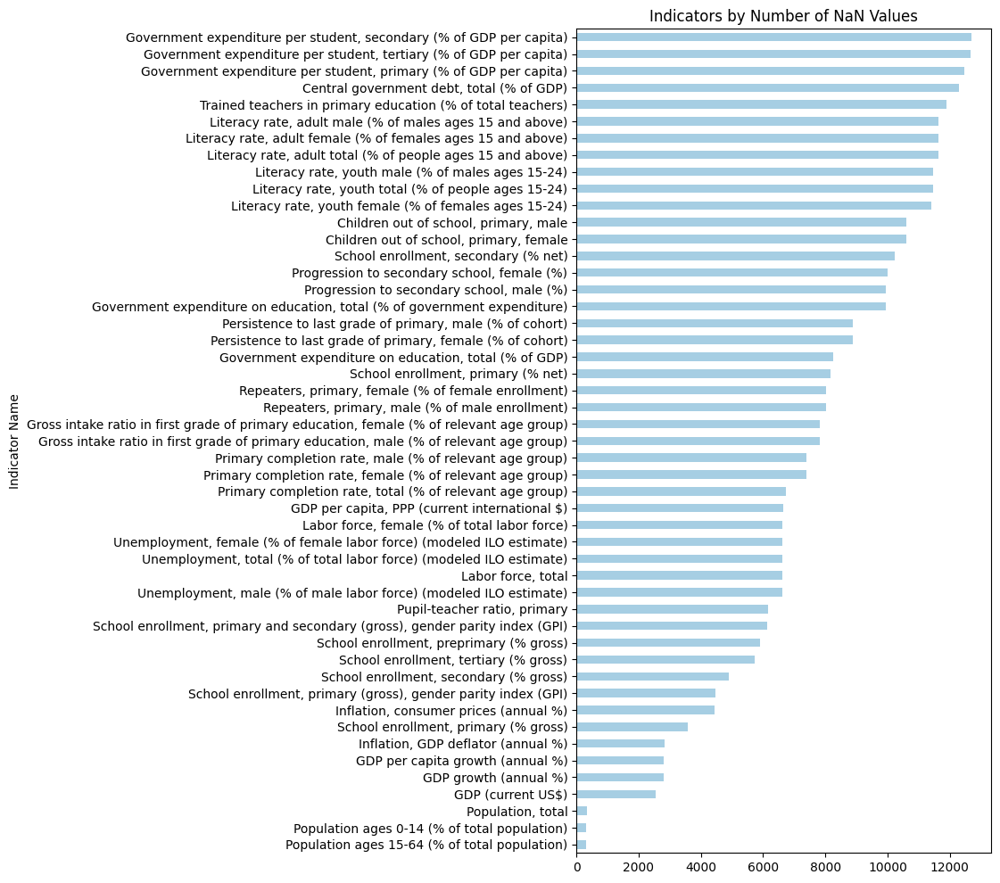

In [16]:
two_way_table_NaN[True].sort_values(ascending = True).plot(kind='barh', rot=0, colormap='Paired', title = 'Indicators by Number of NaN Values',figsize=(6,12))

<AxesSubplot: title={'center': 'Indicators by Percentage of NaN Values'}, ylabel='Indicator Name'>

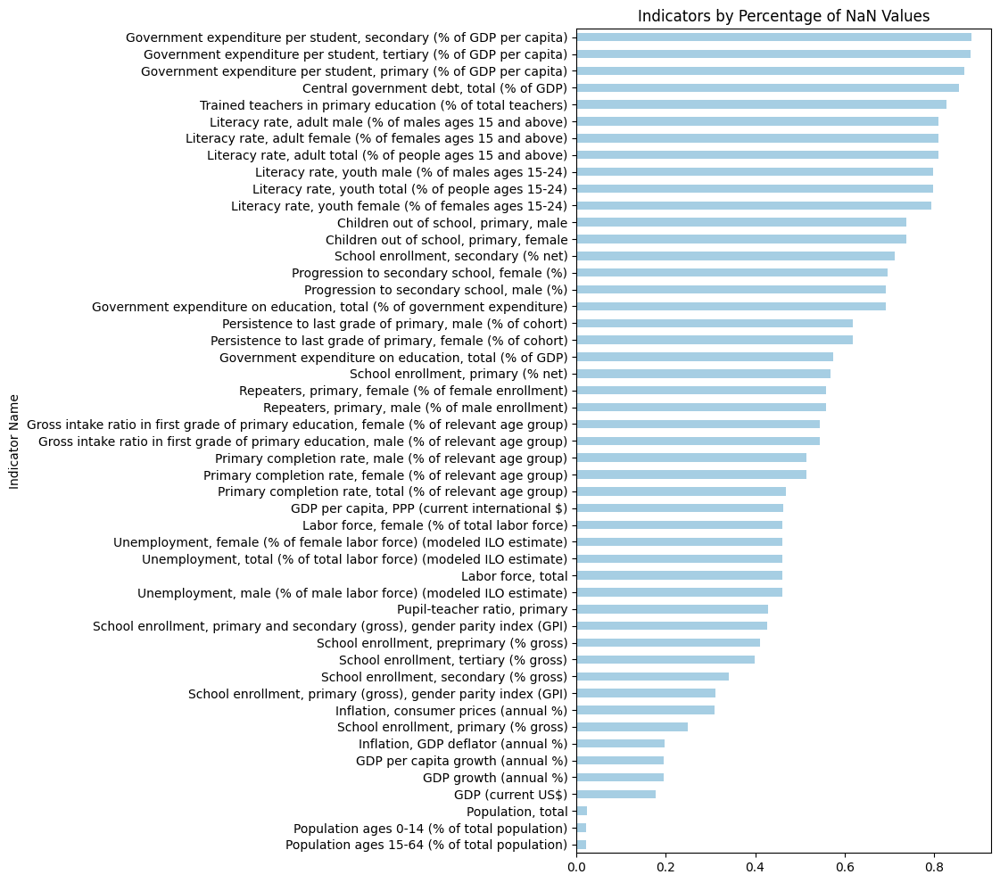

In [108]:
two_way_table_NaN["Percentage of NaN"].sort_values(ascending = True).plot(kind='barh', rot=0, colormap='Paired', title = 'Indicators by Percentage of NaN Values',figsize=(6,12))

### 2.2 NaN values by "Country Name"

In [109]:
two_way_table_NaN = pd.crosstab(index=df["Country Name"], columns=df["Is_NaN"])
two_way_table_NaN["Sum"] = two_way_table_NaN.sum(axis=1)
two_way_table_NaN["Percentage of NaN"] = two_way_table_NaN[True]/two_way_table_NaN["Sum"]
display(two_way_table_NaN.head(5))

Is_NaN,False,True,Sum,Percentage of NaN
Country Name,,,,
Afghanistan,883,1763,2646,0.666289
Africa Eastern and Southern,1447,1199,2646,0.453137
Africa Western and Central,1482,1164,2646,0.439909
Albania,1175,1471,2646,0.555933
Algeria,1599,1047,2646,0.395692


<AxesSubplot: title={'center': 'Top 30 Countries by Number of NaN Values'}, ylabel='Country Name'>

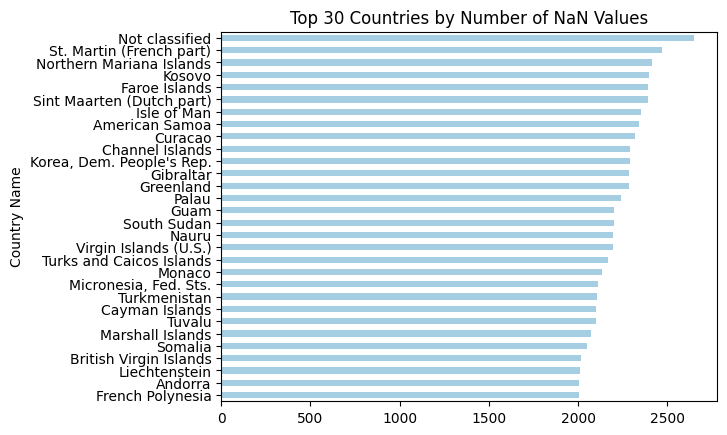

In [11]:
two_way_table_NaN[True].sort_values(ascending = True).tail(30).plot(kind='barh', rot=0, colormap='Paired', title = 'Top 30 Countries by Number of NaN Values')

<AxesSubplot: title={'center': 'Top 30 Countries by Percentage of NaN Values'}, ylabel='Country Name'>

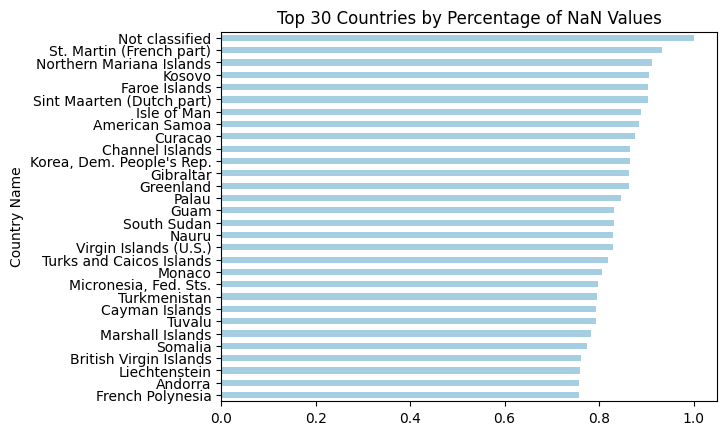

In [110]:
two_way_table_NaN["Percentage of NaN"].sort_values(ascending = True).tail(30).plot(kind='barh', rot=0, colormap='Paired', title = 'Top 30 Countries by Percentage of NaN Values')

<AxesSubplot: title={'center': 'Bottom 30 Countries by Number of NaN Values'}, ylabel='Country Name'>

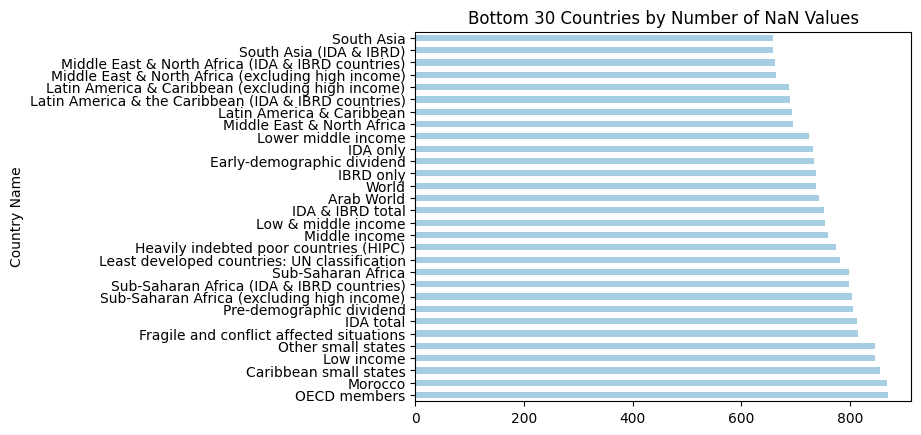

In [12]:
two_way_table_NaN[True].sort_values(ascending = True).head(30).plot(kind='barh', rot=0, colormap='Paired', title = 'Bottom 30 Countries by Number of NaN Values')

<AxesSubplot: title={'center': 'Bottom 30 Countries by Percentage of NaN Values'}, ylabel='Country Name'>

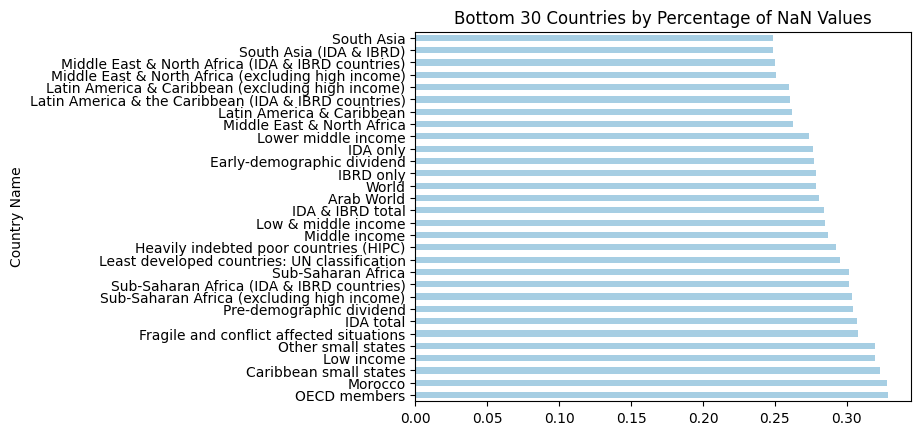

In [113]:
two_way_table_NaN["Percentage of NaN"].sort_values(ascending = False).tail(30).plot(kind='barh', rot=0, colormap='Paired', title = 'Bottom 30 Countries by Percentage of NaN Values')

### 2.3 NaN values by "year"

In [114]:
two_way_table_NaN = pd.crosstab(index=df["year"], columns=df["Is_NaN"])
two_way_table_NaN["Sum"] = two_way_table_NaN.sum(axis=1)
two_way_table_NaN["Percentage of NaN"] = two_way_table_NaN[True]/two_way_table_NaN["Sum"]
display(two_way_table_NaN.head(5))

Is_NaN,False,True,Sum,Percentage of NaN
year,,,,
1970,2484,10550,13034,0.809422
1971,3703,9331,13034,0.715897
1972,3779,9255,13034,0.710066
1973,3794,9240,13034,0.708915
1974,3806,9228,13034,0.707994


<AxesSubplot: title={'center': 'Number of NaN Values from 1970 to 2023'}, xlabel='year'>

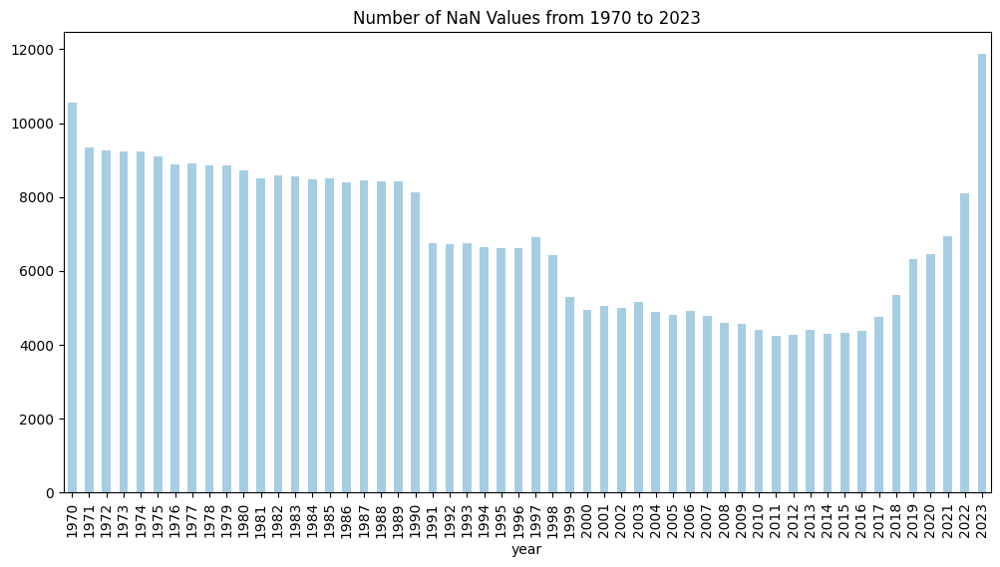

In [115]:
two_way_table_NaN[True].plot(kind='bar', rot=90, colormap='Paired', title = 'Number of NaN Values from 1970 to 2023',figsize=(12,6))

<AxesSubplot: title={'center': 'Percentage of NaN Values from 1970 to 2023'}, xlabel='year'>

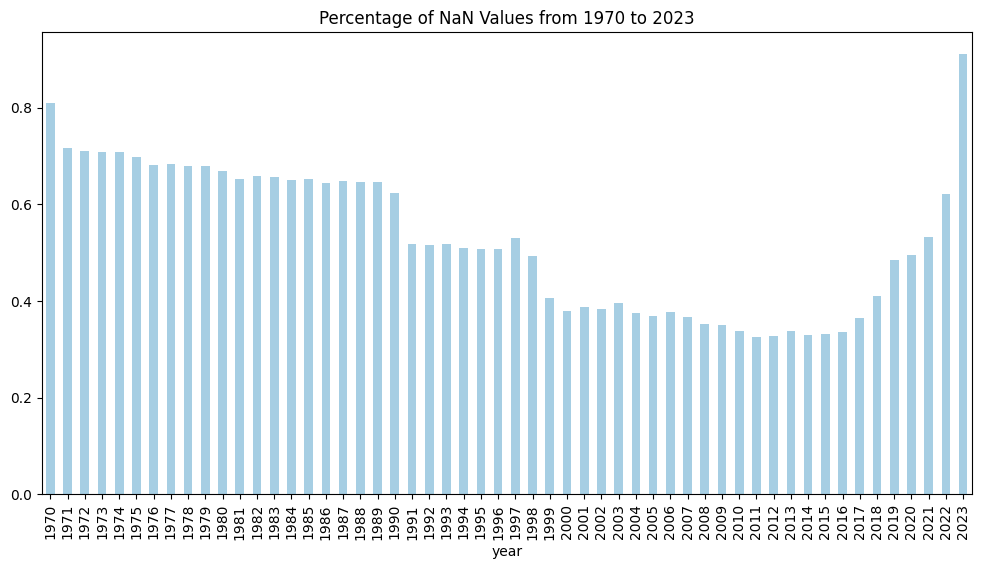

In [116]:
two_way_table_NaN["Percentage of NaN"].plot(kind='bar', rot=90, colormap='Paired', title = 'Percentage of NaN Values from 1970 to 2023',figsize=(12,6))

### 2.4 NaN values of "World", "High income", "Low income", "Lower middle income", "Upper middle income"

In [124]:
# Select countries
df_income = df[df["Country Name"].isin([ "World", "High income", "Low income", "Lower middle income", "Upper middle income"])]
df_income.head(5)

,Country Name,Country Code,Indicator Name,Indicator Code,year,value,Is_NaN
95,High income,HIC,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN,True
136,Low income,LIC,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN,True
139,Lower middle income,LMC,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN,True
249,Upper middle income,UMC,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN,True
259,World,WLD,"Children out of school, primary, female",SE.PRM.UNER.FE,1970,NaN,True


In [125]:
two_way_table_NaN = pd.crosstab(index=df_income["Country Name"], columns=df_income["Is_NaN"])
two_way_table_NaN["Sum"] = two_way_table_NaN.sum(axis=1)
two_way_table_NaN["Percentage of NaN"] = two_way_table_NaN[True]/two_way_table_NaN["Sum"]
display(two_way_table_NaN.head(5))

Is_NaN,False,True,Sum,Percentage of NaN
Country Name,,,,
High income,1709,937,2646,0.354119
Low income,1800,846,2646,0.319728
Lower middle income,1921,725,2646,0.273998
Upper middle income,1693,953,2646,0.360166
World,1909,737,2646,0.278534


<AxesSubplot: title={'center': 'Countries by Number of NaN Values'}, ylabel='Country Name'>

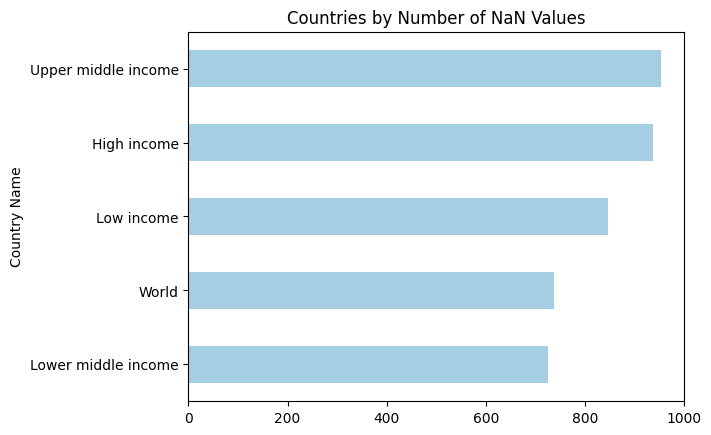

In [126]:
two_way_table_NaN[True].sort_values(ascending = True).tail(30).plot(kind='barh', rot=0, colormap='Paired', title = 'Countries by Number of NaN Values')

<AxesSubplot: title={'center': 'Countries by Percentage of NaN Values'}, ylabel='Country Name'>

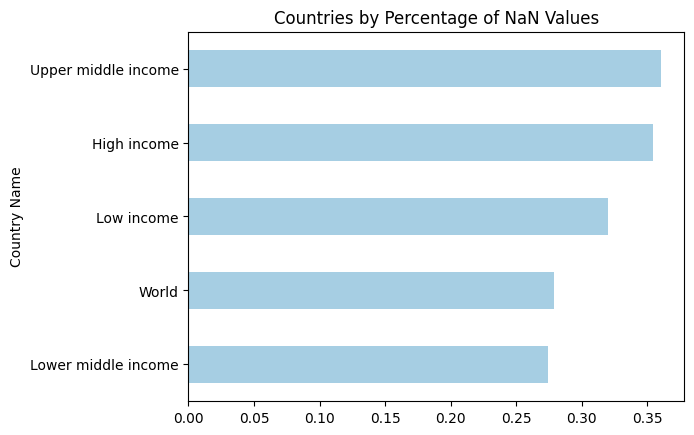

In [127]:
two_way_table_NaN["Percentage of NaN"].sort_values(ascending = True).tail(30).plot(kind='barh', rot=0, colormap='Paired', title = 'Countries by Percentage of NaN Values')

## Section 3: Analyzing Government Expenditure on Education

### 1. Analysis on World Level Data

#### 1.1 Pivot Table

In [128]:
# Pivot table for "World"
pivot_WO = df[(df['Country Name']=='World') & (~df['value'].isna())].pivot(index='year', columns='Indicator Name', values='value')
pivot_WO.head(5)

Indicator Name,GDP (current US$),GDP growth (annual %),GDP per capita growth (annual %),"GDP per capita, PPP (current international $)","Government expenditure on education, total (% of GDP)","Government expenditure on education, total (% of government expenditure)","Government expenditure per student, primary (% of GDP per capita)","Government expenditure per student, secondary (% of GDP per capita)","Government expenditure per student, tertiary (% of GDP per capita)","Gross intake ratio in first grade of primary education, female (% of relevant age group)",...,"School enrollment, primary (% net)","School enrollment, primary (gross), gender parity index (GPI)","School enrollment, primary and secondary (gross), gender parity index (GPI)","School enrollment, secondary (% gross)","School enrollment, secondary (% net)","School enrollment, tertiary (% gross)",Trained teachers in primary education (% of total teachers),"Unemployment, female (% of female labor force) (modeled ILO estimate)","Unemployment, male (% of male labor force) (modeled ILO estimate)","Unemployment, total (% of total labor force) (modeled ILO estimate)"
year,,,,,,,,,,,,,,,,,,,,,
1970,3.009970e+12,4.015200,1.883232,NaN,NaN,NaN,NaN,NaN,NaN,95.65449,...,71.67935,0.80289,0.79059,40.615238,NaN,9.98770,NaN,NaN,NaN,NaN
1971,3.323043e+12,4.268930,2.118204,NaN,NaN,NaN,NaN,NaN,NaN,96.15172,...,71.57806,0.80188,0.78921,42.110039,NaN,9.83962,NaN,NaN,NaN,NaN
1972,3.835299e+12,5.617484,3.537960,NaN,NaN,NaN,NaN,NaN,NaN,96.81683,...,72.43951,0.80118,0.78844,44.263168,NaN,10.04893,NaN,NaN,NaN,NaN
1973,4.655916e+12,6.417756,4.343438,NaN,NaN,NaN,NaN,NaN,NaN,97.44983,...,74.63163,0.79894,0.78982,46.122391,NaN,10.25578,NaN,NaN,NaN,NaN
1974,5.333766e+12,1.853358,-0.080558,NaN,NaN,NaN,NaN,NaN,NaN,97.85006,...,75.33089,0.79503,0.79140,47.236149,NaN,10.48767,NaN,NaN,NaN,NaN


#### 1.2 Trend of government expenditure on education

##### 1.2.1 Government expenditure on education as a percentage of GDP

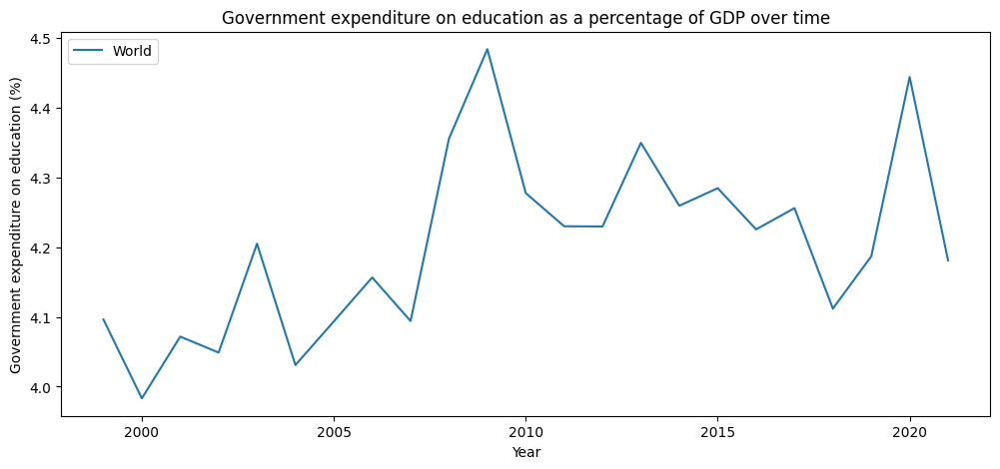

In [136]:
df_WO = pivot_WO["Government expenditure on education, total (% of GDP)"]

df_WO.columns = ["World"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_WO.index, df_WO.values)
plt.title("Government expenditure on education as a percentage of GDP over time")
plt.xlabel("Year")
plt.ylabel("Government expenditure on education (%)")
plt.legend(df_WO.columns, loc = "upper left")

##### 1.2.2  Government expenditure on education as a percentage of total general government expenditure on all sectors

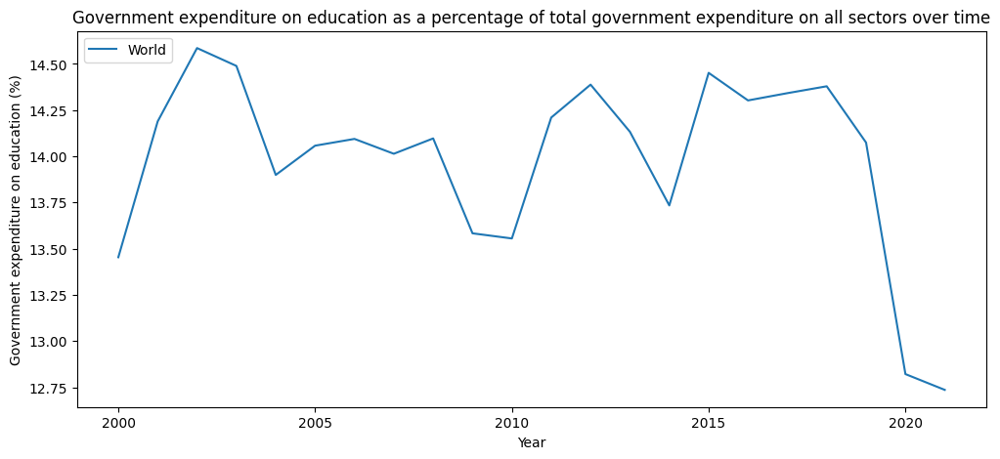

In [137]:
df_WO = pivot_WO["Government expenditure on education, total (% of government expenditure)"]

df_WO.columns = ["World"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_WO.index, df_WO.values)
plt.title("Government expenditure on education as a percentage of total government expenditure on all sectors over time")
plt.xlabel("Year")
plt.ylabel("Government expenditure on education (%)")
plt.legend(df_WO.columns, loc = "upper left")

#### 1.3 Trend of school enrollment

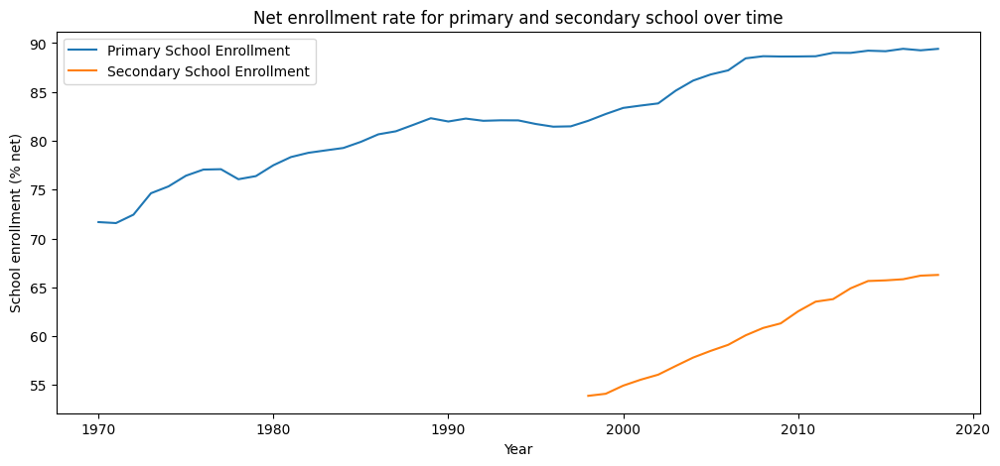

In [144]:
df_GE_GDP = pd.concat([pivot_WO["School enrollment, primary (% net)"],
                   pivot_WO["School enrollment, secondary (% net)"]],axis=1)

df_GE_GDP.columns = ["Primary School Enrollment", "Secondary School Enrollment"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_GE_GDP.index, df_GE_GDP.values)
plt.title("Net enrollment rate for primary and secondary school over time")
plt.xlabel("Year")
plt.ylabel("School enrollment (% net)")
plt.legend(df_GE_GDP.columns, loc = "upper left")

#### 1.4 Trend of primary completion rate

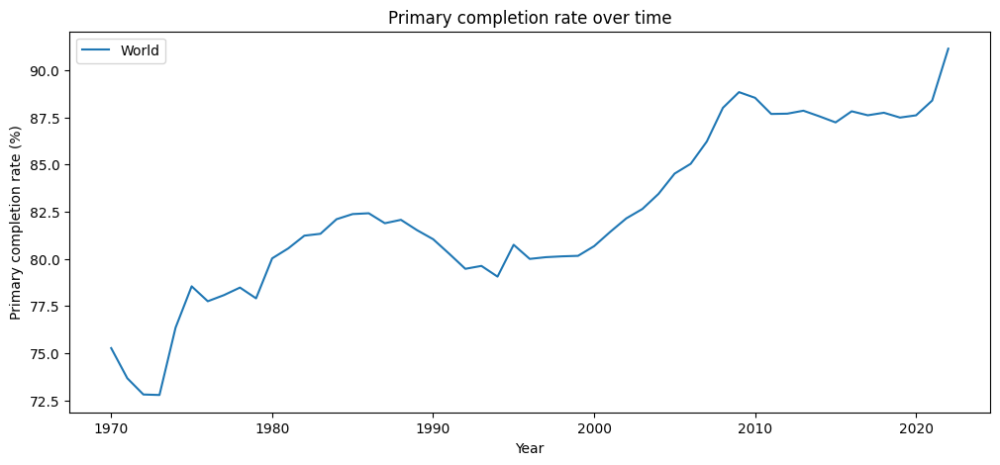

In [145]:
df_WO = pivot_WO["Primary completion rate, total (% of relevant age group)"]

df_WO.columns = ["World"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_WO.index, df_WO.values)
plt.title("Primary completion rate over time")
plt.xlabel("Year")
plt.ylabel("Primary completion rate (%)")
plt.legend(df_WO.columns, loc = "upper left")

#### 1.5 Trend of pupil-teacher ratio

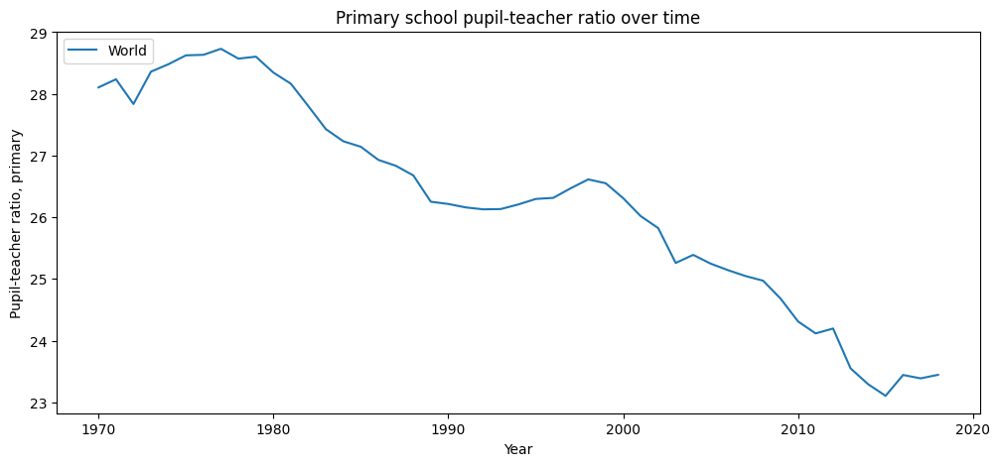

In [146]:
df_WO = pivot_WO["Pupil-teacher ratio, primary"]

df_WO.columns = ["World"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_WO.index, df_WO.values)
plt.title("Primary school pupil-teacher ratio over time")
plt.xlabel("Year")
plt.ylabel("Pupil-teacher ratio, primary")
plt.legend(df_WO.columns, loc = "upper left")

#### 2.6 Correlation Matrix

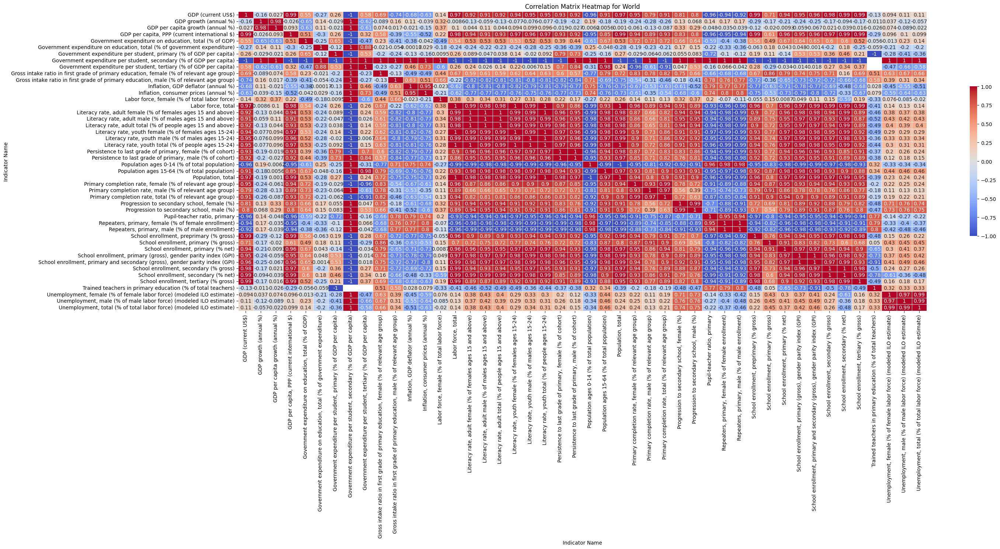

In [153]:
# Obtain the correlation matrix
correlation_matrix_WO = pivot_WO.corr(numeric_only=True)

# Plot the heatmap using seaborn
plt.figure(figsize=(30, 15))
sns.heatmap(correlation_matrix_WO, annot=True, cmap='coolwarm', center=0, 
            linewidths=.5, cbar_kws={"shrink": .5})

# Add title and adjust layout
plt.title("Correlation Matrix Heatmap for World")
plt.tight_layout()

# Show the plot
plt.show()

<AxesSubplot: ylabel='Indicator Name'>

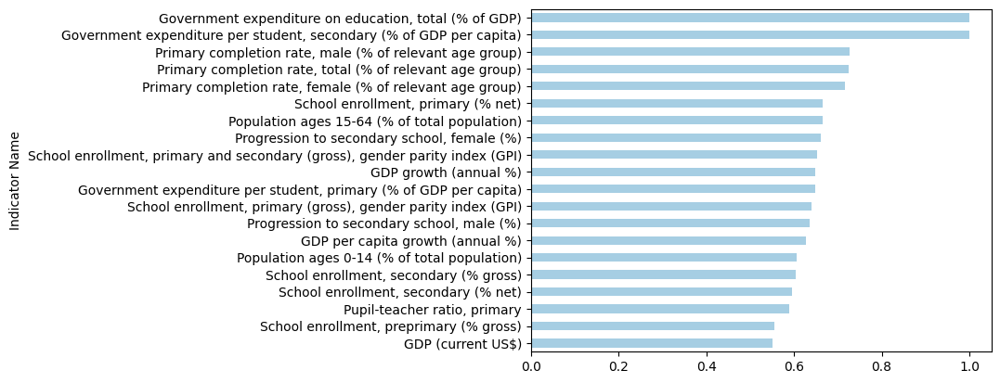

In [158]:
correlation_matrix_WO_temp = correlation_matrix_WO["Government expenditure on education, total (% of GDP)"]


correlation_matrix_WO_temp.abs().sort_values(ascending = False).head(20).sort_values(ascending = True).plot(kind='barh', rot=0, colormap='Paired')


<AxesSubplot: ylabel='Indicator Name'>

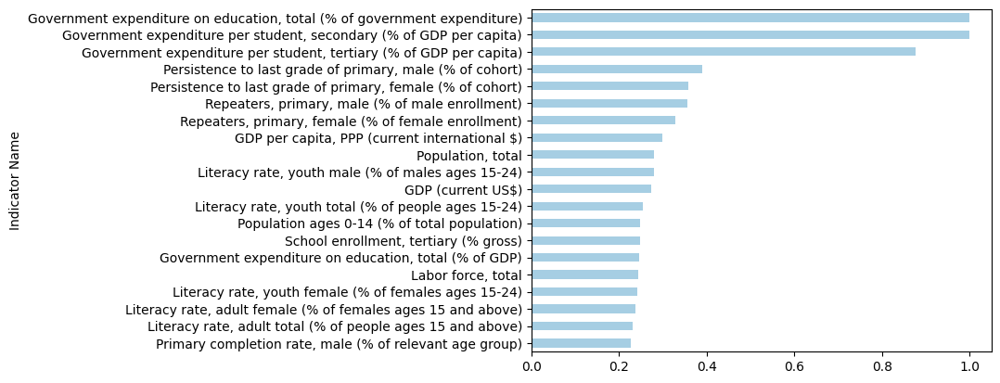

In [161]:
correlation_matrix_WO_temp = correlation_matrix_WO["Government expenditure on education, total (% of government expenditure)"]


correlation_matrix_WO_temp.abs().sort_values(ascending = False).head(20).sort_values(ascending = True).plot(kind='barh', rot=0, colormap='Paired')


In [ ]:
correlation_matrix_WO = correlation_matrix_WO[["Government expenditure on education, total (% of GDP)",
                       "Government expenditure on education, total (% of government expenditure)",]]

# prepare subplot
fig, axes = plt.subplots(len(correlation_matrix_HI_GE.columns),1)
fig.set_figheight(15)
fig.set_figwidth(15)

total = 0
for column in correlation_matrix_HI_GE:
    df_temp = correlation_matrix_HI_GE[column].abs().sort_values(ascending = False).head(20).sort_values(ascending = True).plot(kind='barh', rot=0, colormap='Paired', ax = axes[total], title = f'The top 20 correlation coefficient between {column} and another indicator')
    total = total + 1

fig.tight_layout(pad=2.0)
plt.show()

### 2. Analysis on "High income", "Low income", "Lower middle income", "Upper middle income" countries

#### 2.1 Pivot Table

In [18]:
# Pivot table for "High income"
pivot_HI = df[(df['Country Name']=='High income') & (~df['value'].isna())].pivot(index='year', columns='Indicator Name', values='value')
pivot_HI.head(5)

Indicator Name,"Central government debt, total (% of GDP)",GDP (current US$),GDP growth (annual %),GDP per capita growth (annual %),"GDP per capita, PPP (current international $)","Government expenditure on education, total (% of GDP)","Government expenditure on education, total (% of government expenditure)","Government expenditure per student, primary (% of GDP per capita)","Government expenditure per student, secondary (% of GDP per capita)","Government expenditure per student, tertiary (% of GDP per capita)",...,"School enrollment, primary (% net)","School enrollment, primary (gross), gender parity index (GPI)","School enrollment, primary and secondary (gross), gender parity index (GPI)","School enrollment, secondary (% gross)","School enrollment, secondary (% net)","School enrollment, tertiary (% gross)",Trained teachers in primary education (% of total teachers),"Unemployment, female (% of female labor force) (modeled ILO estimate)","Unemployment, male (% of male labor force) (modeled ILO estimate)","Unemployment, total (% of total labor force) (modeled ILO estimate)"
year,,,,,,,,,,,,,,,,,,,,,
1970,NaN,2.399020e+12,3.187223,2.159231,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.99068,0.91455,78.100937,NaN,25.228910,NaN,NaN,NaN,NaN
1971,NaN,2.663396e+12,3.886732,2.670308,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.99135,0.91428,78.019890,NaN,25.144291,NaN,NaN,NaN,NaN
1972,NaN,3.090313e+12,5.533616,4.461048,NaN,NaN,NaN,NaN,NaN,NaN,...,88.63960,0.99155,0.91385,79.206848,NaN,26.383289,NaN,NaN,NaN,NaN
1973,NaN,3.740189e+12,6.316346,5.282526,NaN,NaN,NaN,NaN,NaN,NaN,...,89.16610,0.99549,0.92809,80.168938,NaN,27.275999,NaN,NaN,NaN,NaN
1974,NaN,4.217064e+12,1.092032,0.136866,NaN,NaN,NaN,NaN,NaN,NaN,...,89.00047,0.99014,0.93576,81.409401,NaN,27.850920,NaN,NaN,NaN,NaN


In [19]:
# Pivot table for "Upper middle income"
pivot_UMI = df[(df['Country Name']=='Upper middle income') & (~df['value'].isna())].pivot(index='year', columns='Indicator Name', values='value')

In [20]:
# Pivot table for "Lower middle income"
pivot_LMI = df[(df['Country Name']=='Lower middle income') & (~df['value'].isna())].pivot(index='year', columns='Indicator Name', values='value')

In [21]:
# Pivot table for "Low income"
pivot_LI = df[(df['Country Name']=='Low income') & (~df['value'].isna())].pivot(index='year', columns='Indicator Name', values='value')

#### 2.2 Trend of government expenditure on education

##### 2.2.1 Government expenditure on education as a percentage of GDP

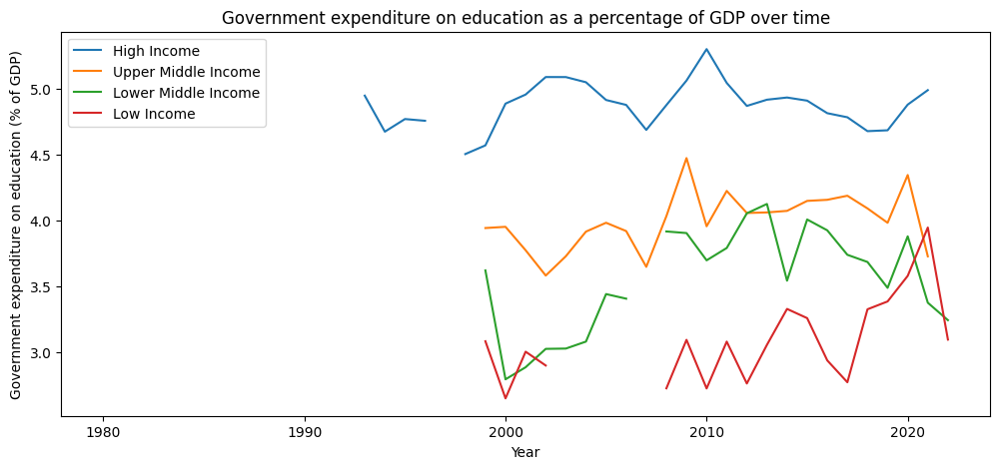

In [22]:
df_GE_GDP = pd.concat([pivot_HI["Government expenditure on education, total (% of GDP)"],
                   pivot_UMI["Government expenditure on education, total (% of GDP)"],
                   pivot_LMI["Government expenditure on education, total (% of GDP)"],
                   pivot_LI["Government expenditure on education, total (% of GDP)"]],axis=1)

df_GE_GDP.columns = ["High Income", "Upper Middle Income", "Lower Middle Income", "Low Income"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_GE_GDP.index, df_GE_GDP.values)
plt.title("Government expenditure on education as a percentage of GDP over time")
plt.xlabel("Year")
plt.ylabel("Government expenditure on education (% of GDP)")
plt.legend(df_GE_GDP.columns, loc = "upper left")

Government expenditure on education, total (% of GDP) is calculated by dividing total government expenditure for all levels of education by the GDP, and multiplying by 100. 

##### 2.2.2  Government expenditure on education as a percentage of total general government expenditure on all sectors

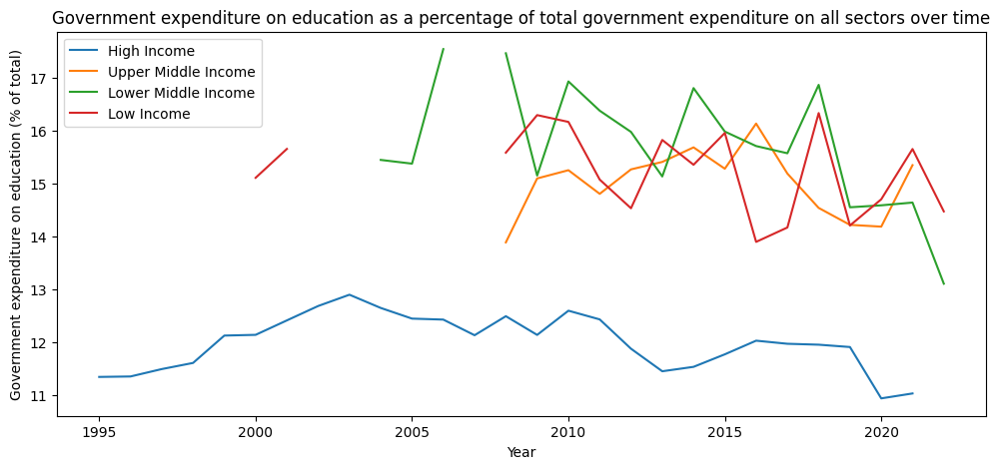

In [23]:
df_GE_EP = pd.concat([pivot_HI["Government expenditure on education, total (% of government expenditure)"],
                   pivot_UMI["Government expenditure on education, total (% of government expenditure)"],
                   pivot_LMI["Government expenditure on education, total (% of government expenditure)"],
                   pivot_LI["Government expenditure on education, total (% of government expenditure)"]],axis=1)

df_GE_EP.columns = ["High Income", "Upper Middle Income", "Lower Middle Income", "Low Income"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_GE_EP.index, df_GE_EP.values)
plt.title("Government expenditure on education as a percentage of total government expenditure on all sectors over time")
plt.xlabel("Year")
plt.ylabel("Government expenditure on education (% of total)")
plt.legend(df_GE_EP.columns, loc = "upper left")

Expenditure on education, total (% of government expenditure) is calculated by dividing total government expenditure on education by the total government expenditure on all sectors and multiplying by 100. 

#### 2.3 Trend of school enrollment

##### 2.3.1 Net enrollment rate for primary school

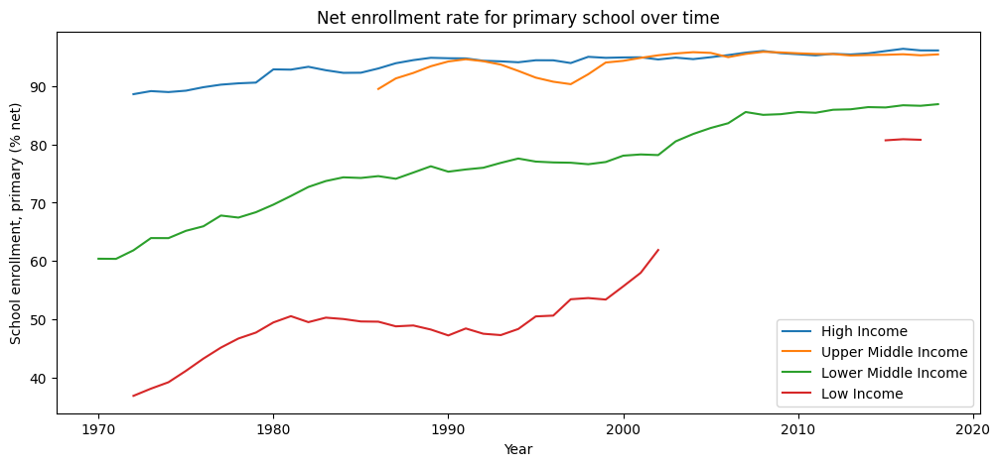

In [24]:
df_SE_PI = pd.concat([pivot_HI["School enrollment, primary (% net)"],
                   pivot_UMI["School enrollment, primary (% net)"],
                   pivot_LMI["School enrollment, primary (% net)"],
                   pivot_LI["School enrollment, primary (% net)"]],axis=1)

df_SE_PI.columns = ["High Income", "Upper Middle Income", "Lower Middle Income", "Low Income"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_SE_PI.index, df_SE_PI.values)
plt.title("Net enrollment rate for primary school over time")
plt.xlabel("Year")
plt.ylabel("School enrollment, primary (% net)")
plt.legend(df_SE_PI.columns, loc = "lower right")

Net enrollment rate for primary school is calculated by dividing the number of students of **official school age** enrolled in primary education by the population of the age group which officially corresponds to primary education, and multiplying by 100. 

##### 2.3.2 Gross enrollment ratio for primary school

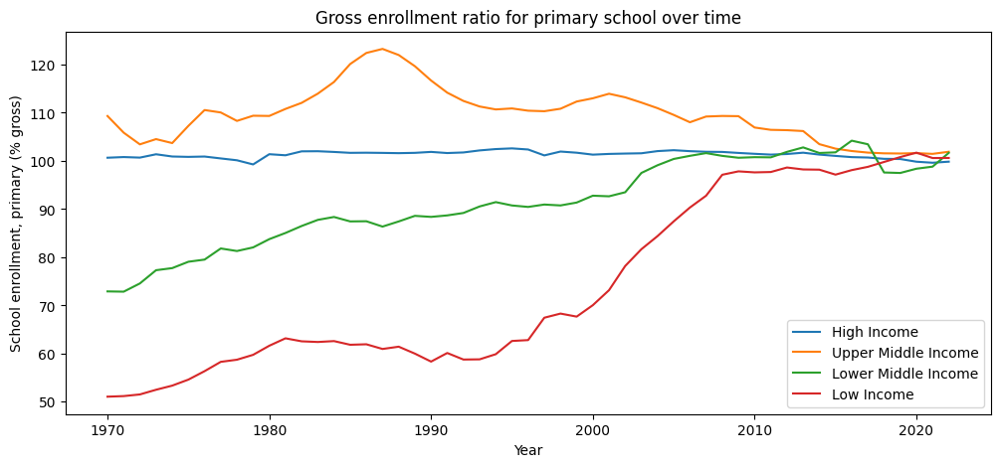

In [25]:
df_SE_PI = pd.concat([pivot_HI["School enrollment, primary (% gross)"],
                   pivot_UMI["School enrollment, primary (% gross)"],
                   pivot_LMI["School enrollment, primary (% gross)"],
                   pivot_LI["School enrollment, primary (% gross)"]],axis=1)

df_SE_PI.columns = ["High Income", "Upper Middle Income", "Lower Middle Income", "Low Income"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_SE_PI.index, df_SE_PI.values)
plt.title("Gross enrollment ratio for primary school over time")
plt.xlabel("Year")
plt.ylabel("School enrollment, primary (% gross)")
plt.legend(df_SE_PI.columns, loc = "lower right")

Gross enrollment ratio for primary school is calculated by dividing the number of students enrolled in primary education **regardless of age** by the population of the age group which officially corresponds to primary education, and multiplying by 100.

##### 2.3.3 Net enrollment rate for secondary school

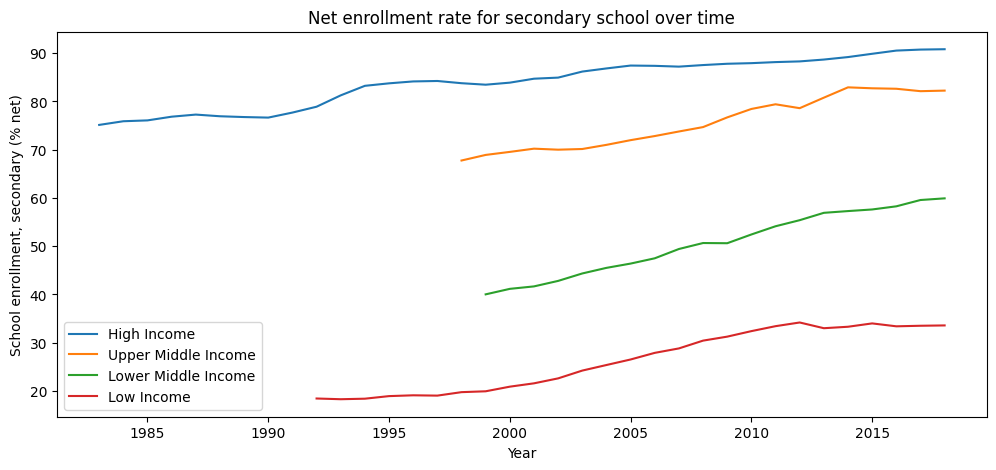

In [26]:
df_SE_SC = pd.concat([pivot_HI["School enrollment, secondary (% net)"],
                   pivot_UMI["School enrollment, secondary (% net)"],
                   pivot_LMI["School enrollment, secondary (% net)"],
                   pivot_LI["School enrollment, secondary (% net)"]],axis=1)

df_SE_SC.columns = ["High Income", "Upper Middle Income", "Lower Middle Income", "Low Income"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_SE_SC.index, df_SE_SC.values)
plt.title("Net enrollment rate for secondary school over time")
plt.xlabel("Year")
plt.ylabel("School enrollment, secondary (% net)")
plt.legend(df_SE_SC.columns, loc = "lower left")

Net enrollment rate for secondary school is calculated by dividing the number of students of **official school age** enrolled in secondary education by the population of the age group which officially corresponds to secondary education, and multiplying by 100.

##### 2.3.4 Gross enrollment ratio for secondary school

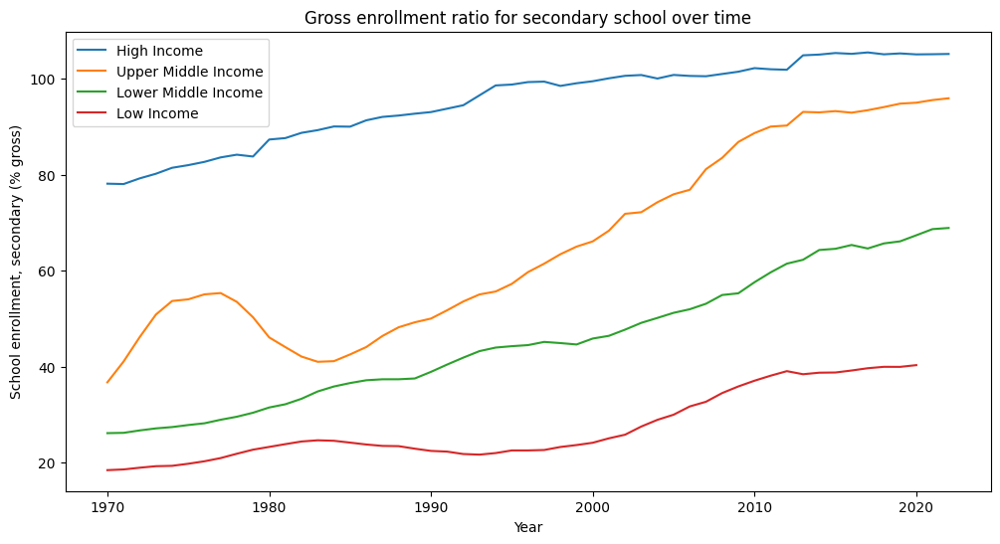

In [27]:
df_SE_SC = pd.concat([pivot_HI["School enrollment, secondary (% gross)"],
                   pivot_UMI["School enrollment, secondary (% gross)"],
                   pivot_LMI["School enrollment, secondary (% gross)"],
                   pivot_LI["School enrollment, secondary (% gross)"]],axis=1)

df_SE_SC.columns = ["High Income", "Upper Middle Income", "Lower Middle Income", "Low Income"]

# Create the line chart
plt.figure(figsize=(12,6))
plt.plot(df_SE_SC.index, df_SE_SC.values)
plt.title("Gross enrollment ratio for secondary school over time")
plt.xlabel("Year")
plt.ylabel("School enrollment, secondary (% gross)")
plt.legend(df_SE_SC.columns, loc = "upper left")

Gross enrollment ratio for secondary school is calculated by dividing the number of students enrolled in secondary education **regardless of age** by the population of the age group which officially corresponds to secondary education, and multiplying by 100.

##### 2.3.5 Gross enrollment ratio for tertiary school

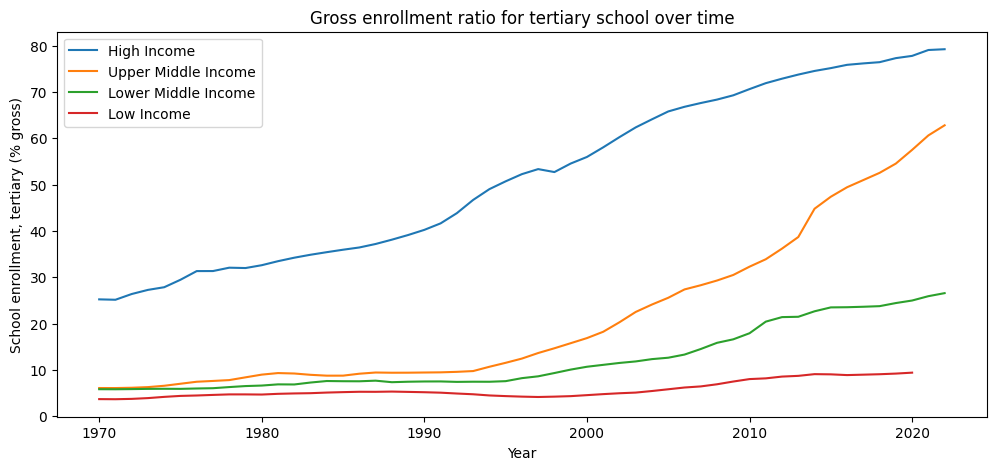

In [28]:
df_SE_TE = pd.concat([pivot_HI["School enrollment, tertiary (% gross)"],
                   pivot_UMI["School enrollment, tertiary (% gross)"],
                   pivot_LMI["School enrollment, tertiary (% gross)"],
                   pivot_LI["School enrollment, tertiary (% gross)"]],axis=1)

df_SE_TE.columns = ["High Income", "Upper Middle Income", "Lower Middle Income", "Low Income"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_SE_TE.index, df_SE_TE.values)
plt.title("Gross enrollment ratio for tertiary school over time")
plt.xlabel("Year")
plt.ylabel("School enrollment, tertiary (% gross)")
plt.legend(df_SE_TE.columns, loc = "upper left")

#### 2.4 Trend of primary completion rate

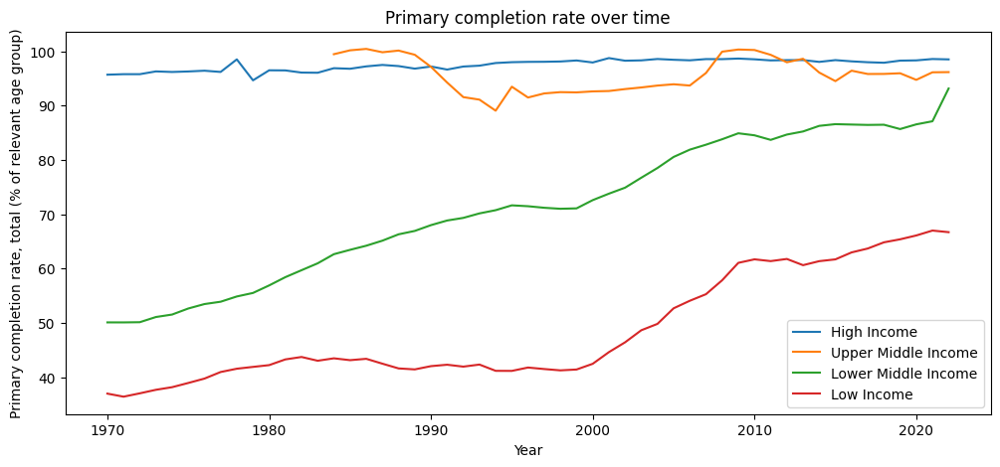

In [29]:
df_PC = pd.concat([pivot_HI["Primary completion rate, total (% of relevant age group)"],
                   pivot_UMI["Primary completion rate, total (% of relevant age group)"],
                   pivot_LMI["Primary completion rate, total (% of relevant age group)"],
                   pivot_LI["Primary completion rate, total (% of relevant age group)"]],axis=1)

df_PC.columns = ["High Income", "Upper Middle Income", "Lower Middle Income", "Low Income"]

# Create the line chart
plt.figure(figsize=(12,5))
plt.plot(df_PC.index, df_PC.values)
plt.title("Primary completion rate over time")
plt.xlabel("Year")
plt.ylabel("Primary completion rate, total (% of relevant age group)")
plt.legend(df_PC.columns, loc = "lower right")

Primary completion rate is calculated by dividing the number of new entrants (enrollment minus repeaters) in the last grade of primary education, regardless of age, by the population at the entrance age for the last grade of primary education and multiplying by 100.

#### 2.5 Trend of pupil-teacher ratio

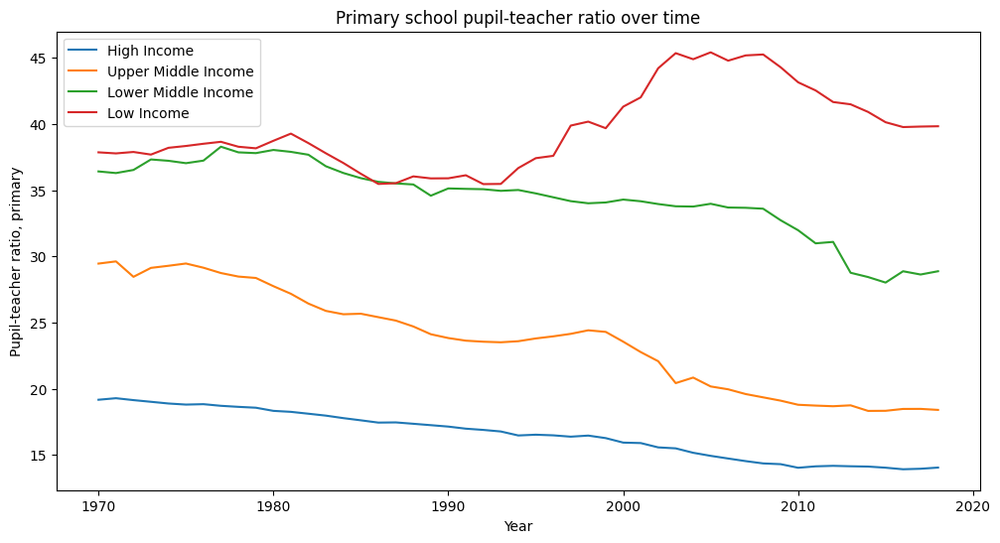

In [30]:
df_PC = pd.concat([pivot_HI["Pupil-teacher ratio, primary"],
                   pivot_UMI["Pupil-teacher ratio, primary"],
                   pivot_LMI["Pupil-teacher ratio, primary"],
                   pivot_LI["Pupil-teacher ratio, primary"]],axis=1)

df_PC.columns = ["High Income", "Upper Middle Income", "Lower Middle Income", "Low Income"]

# Create the line chart
plt.figure(figsize=(12,6))
plt.plot(df_PC.index, df_PC.values)
plt.title("Primary school pupil-teacher ratio over time")
plt.xlabel("Year")
plt.ylabel("Pupil-teacher ratio, primary")
plt.legend(df_PC.columns, loc = "upper left")

Pupil-teacher ratio is calculated by dividing the number of students at the specified level of education by the number of teachers at the same level of education.

#### 2.6 Correlation Matrix

##### 2.6.1 Correlation Matrix for "High income" group

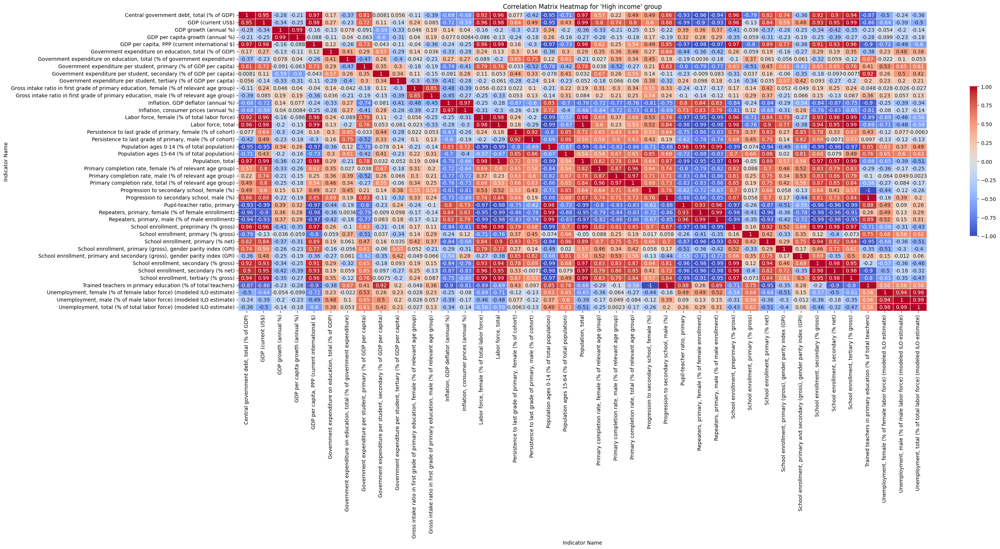

In [43]:
# Obtain the correlation matrix
correlation_matrix_HI = pivot_HI.corr(numeric_only=True)

# Plot the heatmap using seaborn
plt.figure(figsize=(30, 15))
sns.heatmap(correlation_matrix_HI, annot=True, cmap='coolwarm', center=0, 
            linewidths=.5, cbar_kws={"shrink": .5})

# Add title and adjust layout
plt.title("Correlation Matrix Heatmap for 'High income' group")
plt.tight_layout()

# Show the plot
plt.show()

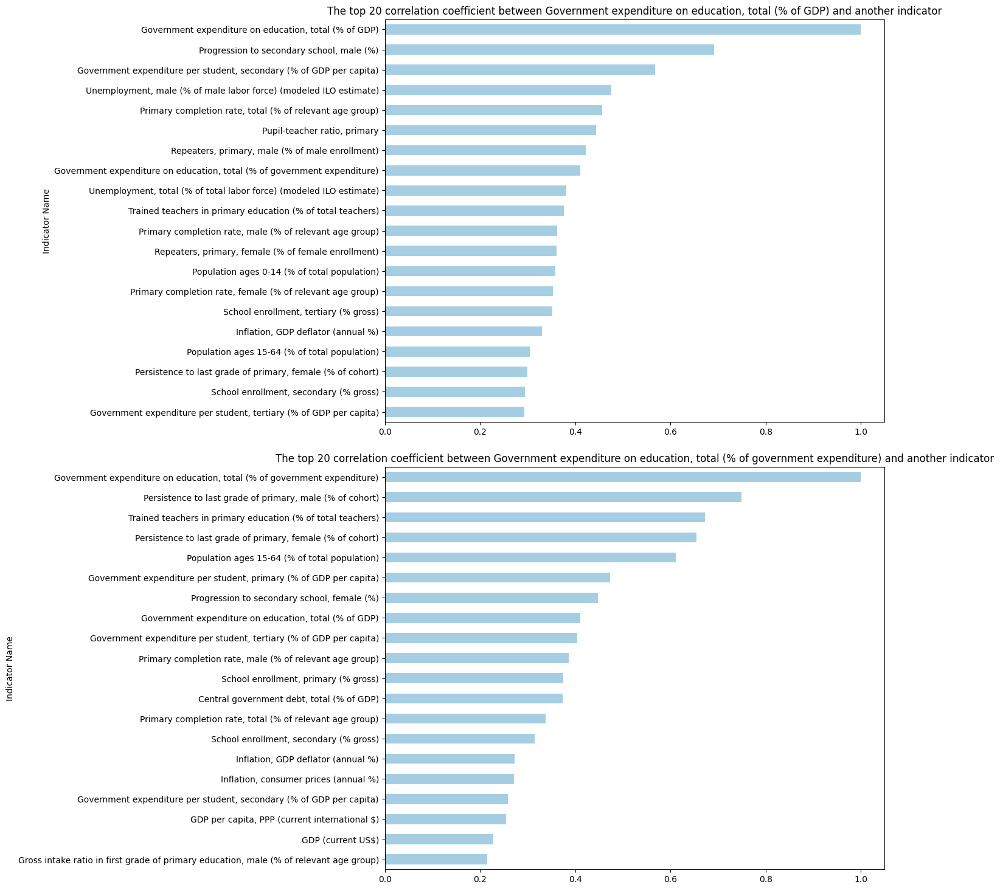

In [73]:
correlation_matrix_HI_GE = correlation_matrix_HI[["Government expenditure on education, total (% of GDP)",
                       "Government expenditure on education, total (% of government expenditure)",]]

# prepare subplot
fig, axes = plt.subplots(len(correlation_matrix_HI_GE.columns),1)
fig.set_figheight(15)
fig.set_figwidth(15)

total = 0
for column in correlation_matrix_HI_GE:
    df_temp = correlation_matrix_HI_GE[column].abs().sort_values(ascending = False).head(20).sort_values(ascending = True).plot(kind='barh', rot=0, colormap='Paired', ax = axes[total], title = f'The top 20 correlation coefficient between {column} and another indicator')
    total = total + 1

fig.tight_layout(pad=2.0)
plt.show()

##### 2.6.2 Correlation Matrix for "Upper middle income" group

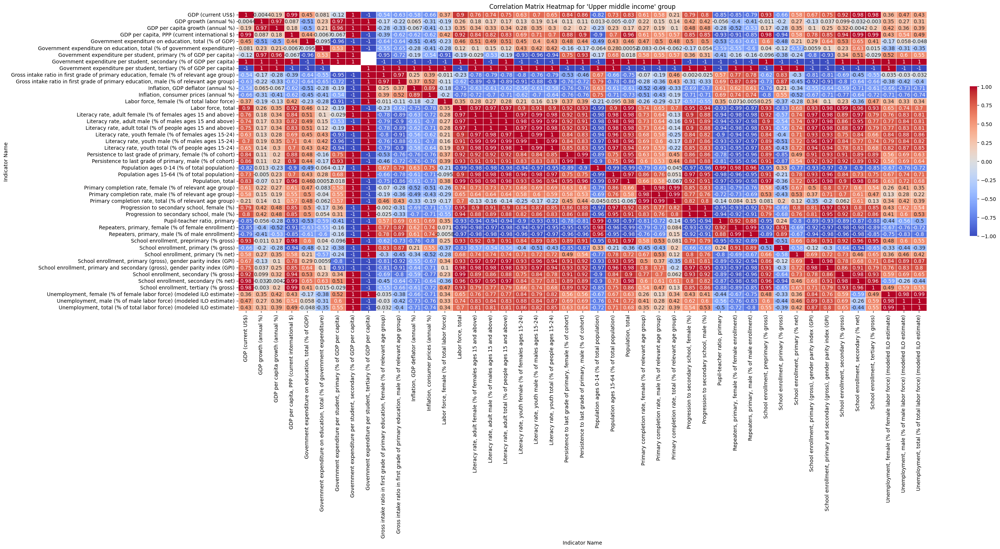

In [34]:
# Obtain the correlation matrix
correlation_matrix_UMI = pivot_UMI.corr()

# Plot the heatmap using seaborn
plt.figure(figsize=(30, 15))
sns.heatmap(correlation_matrix_UMI, annot=True, cmap='coolwarm', center=0, 
            linewidths=.5, cbar_kws={"shrink": .5})

# Add title and adjust layout
plt.title("Correlation Matrix Heatmap for 'Upper middle income' group")
plt.tight_layout()

# Show the plot
plt.show()

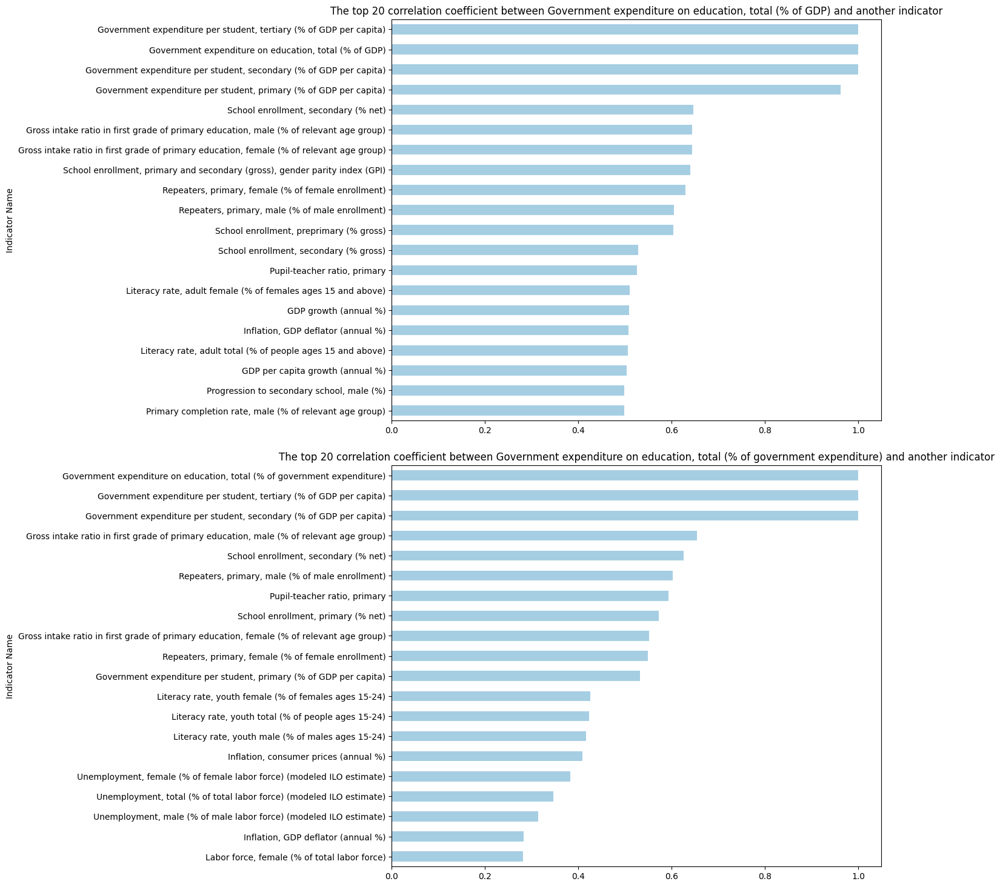

In [74]:
correlation_matrix_UMI_GE = correlation_matrix_UMI[["Government expenditure on education, total (% of GDP)",
                       "Government expenditure on education, total (% of government expenditure)",]]

# prepare subplot
fig, axes = plt.subplots(len(correlation_matrix_UMI_GE.columns),1)
fig.set_figheight(15)
fig.set_figwidth(15)

total = 0
for column in correlation_matrix_UMI_GE:
    df_temp = correlation_matrix_UMI_GE[column].abs().sort_values(ascending = False).head(20).sort_values(ascending = True).plot(kind='barh', rot=0, colormap='Paired', ax = axes[total], title = f'The top 20 correlation coefficient between {column} and another indicator')
    total = total + 1

fig.tight_layout(pad=2.0)
plt.show()

##### 2.6.3 Correlation Matrix for "Lower middle income" group

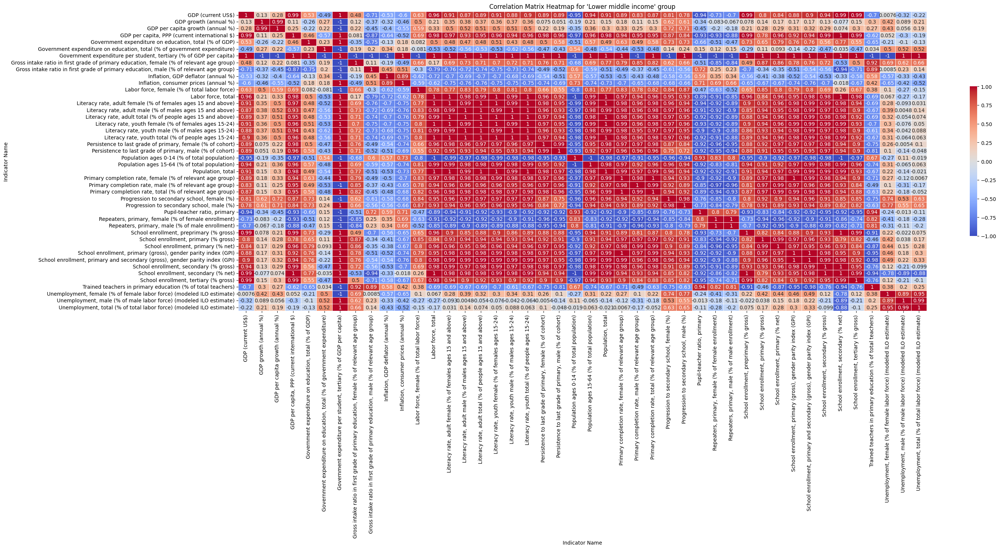

In [35]:
# Obtain the correlation matrix
correlation_matrix_LMI = pivot_LMI.corr()

# Plot the heatmap using seaborn
plt.figure(figsize=(30, 15))
sns.heatmap(correlation_matrix_LMI, annot=True, cmap='coolwarm', center=0, 
            linewidths=.5, cbar_kws={"shrink": .5})

# Add title and adjust layout
plt.title("Correlation Matrix Heatmap for 'Lower middle income' group")
plt.tight_layout()

# Show the plot
plt.show()

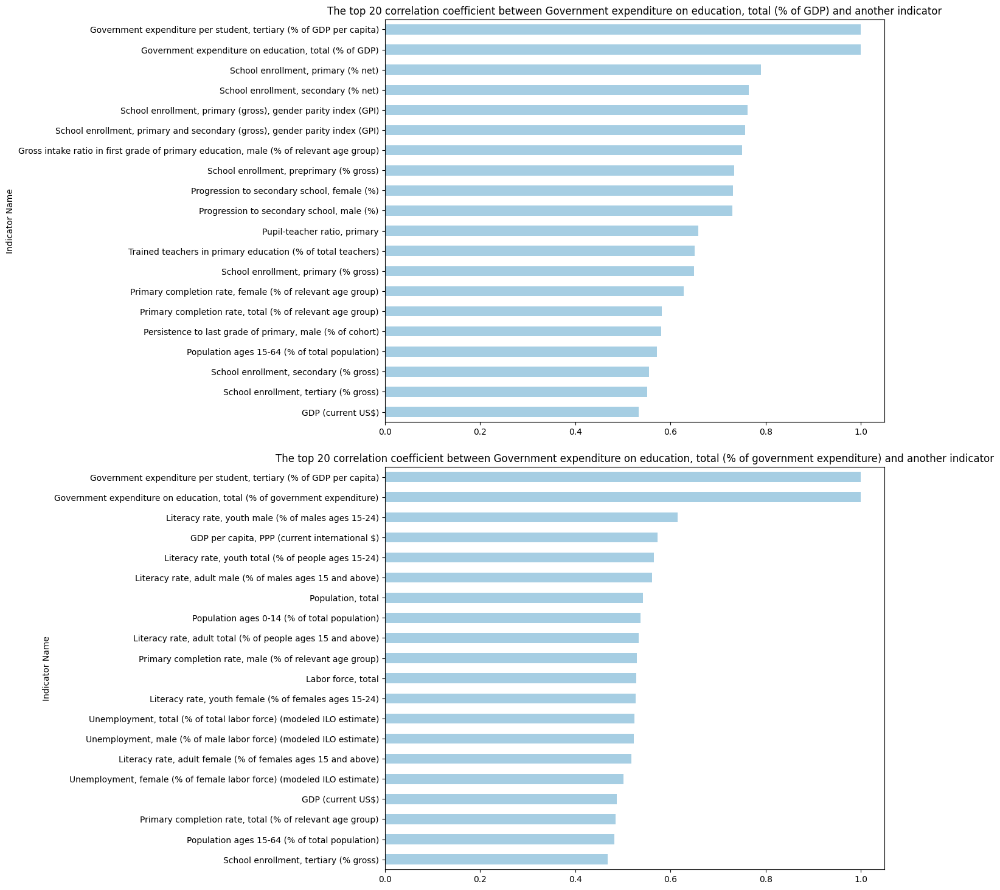

In [75]:
correlation_matrix_LMI_GE = correlation_matrix_LMI[["Government expenditure on education, total (% of GDP)",
                       "Government expenditure on education, total (% of government expenditure)",]]

# prepare subplot
fig, axes = plt.subplots(len(correlation_matrix_LMI_GE.columns),1)
fig.set_figheight(15)
fig.set_figwidth(15)

total = 0
for column in correlation_matrix_LMI_GE:
    df_temp = correlation_matrix_LMI_GE[column].abs().sort_values(ascending = False).head(20).sort_values(ascending = True).plot(kind='barh', rot=0, colormap='Paired', ax = axes[total], title = f'The top 20 correlation coefficient between {column} and another indicator')
    total = total + 1

fig.tight_layout(pad=2.0)
plt.show()

##### 2.6.4 Correlation Matrix for "Low income" group

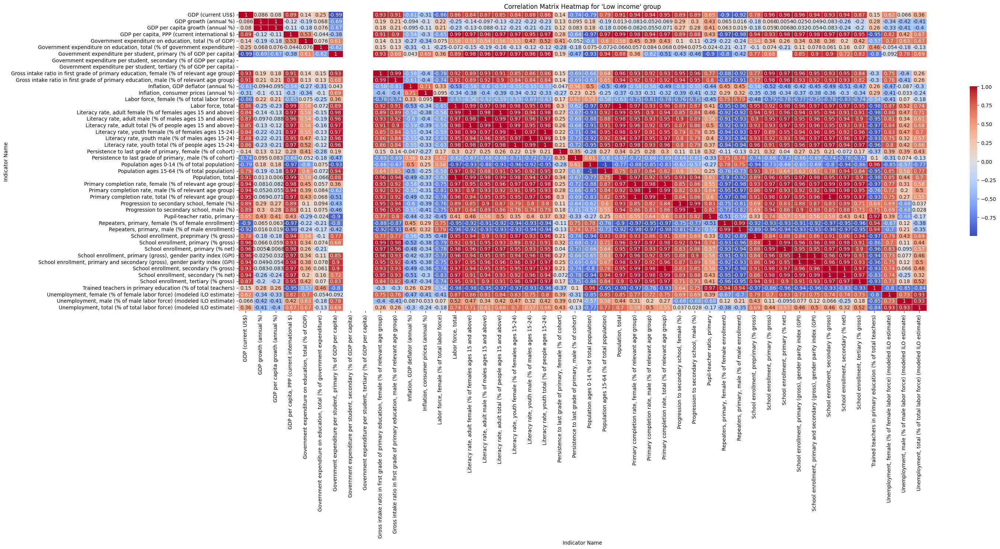

In [36]:
# Obtain the correlation matrix
correlation_matrix_LI = pivot_LI.corr()

# Plot the heatmap using seaborn
plt.figure(figsize=(30, 15))
sns.heatmap(correlation_matrix_LI, annot=True, cmap='coolwarm', center=0, 
            linewidths=.5, cbar_kws={"shrink": .5})

# Add title and adjust layout
plt.title("Correlation Matrix Heatmap for 'Low income' group")
plt.tight_layout()

# Show the plot
plt.show()

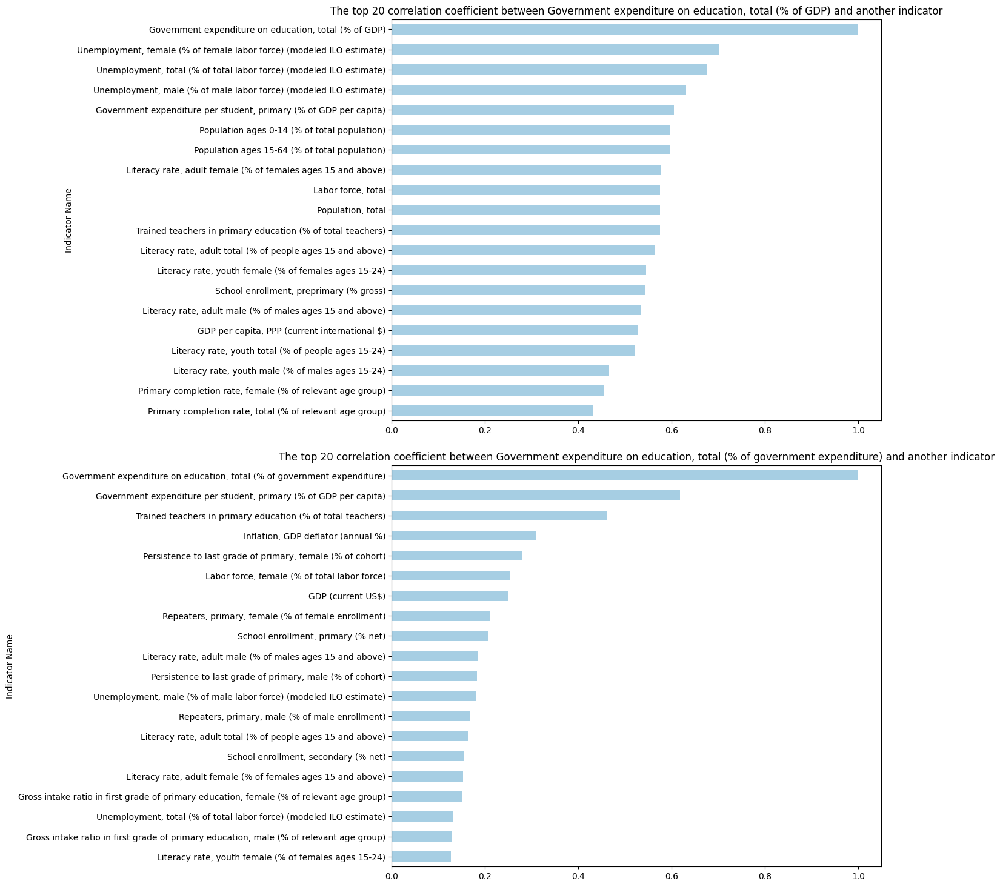

In [76]:
correlation_matrix_LI_GE = correlation_matrix_LI[["Government expenditure on education, total (% of GDP)",
                       "Government expenditure on education, total (% of government expenditure)",]]

# prepare subplot
fig, axes = plt.subplots(len(correlation_matrix_LI_GE.columns),1)
fig.set_figheight(15)
fig.set_figwidth(15)

total = 0
for column in correlation_matrix_LI_GE:
    df_temp = correlation_matrix_LI_GE[column].abs().sort_values(ascending = False).head(20).sort_values(ascending = True).plot(kind='barh', rot=0, colormap='Paired', ax = axes[total], title = f'The top 20 correlation coefficient between {column} and another indicator')
    total = total + 1

fig.tight_layout(pad=2.0)
plt.show()